
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AnjanDutta/ECMM426-ECMM441/blob/main/Notebooks/Image_Processing.ipynb)

<H1 style="text-align: center">ECMM426 - Computer Vision </H1>
<H1 style="text-align: center">Workshop 1</H1>
<H1 style="text-align: center">Image Processing</H1>

[![View on Github](https://img.shields.io/static/v1.svg?logo=github&label=Repo&message=View%20On%20Github&color=lightgrey)](https://github.com/AnjanDutta/ECMM426-ECMM441/blob/main/Notebooks/Image_Processing.ipynb)

In this workshop, we will learn different image processing functions mainly from the [OpenCV](https://opencv.org/) library.

## Imports

In [1]:
import urllib
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20.0, 10.0)
print('OpenCV version: {}'.format(cv2.__version__))

OpenCV version: 4.7.0


## Download Images
Download some images and prepare for reading

In [2]:
import os
if not os.path.exists('images.zip'):
  !wget --no-check-certificate https://empslocal.ex.ac.uk/people/staff/ad735/ECMM426/images.zip
  !unzip -q images.zip

'wget' is not recognized as an internal or external command,
operable program or batch file.
'unzip' is not recognized as an internal or external command,
operable program or batch file.


## Image Data Structures in OpenCV
Colour images usually have three channels: red, green and blue and these channels are usually arranged in a certain order. Depending on this arrangement the image is termed in a certain way. For example, if the channels in an image are ordered in red (R), green (G) and blue (B), the image is called as RGB image. In OpenCV an image can be read by `cv2.imread()` function.

In [3]:
# read an image
img = cv2.imread('images/lena.png')

# show image format (basically a 3-d array of pixel color info, in BGR format)
print('Image shape: {}'.format(img.shape))
print('Image: {}'.format(img))

Image shape: (512, 512, 3)
Image: [[[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 [[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 [[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 ...

 [[ 60  18  84]
  [ 60  18  84]
  [ 58  27  92]
  ...
  [ 84  73 173]
  [ 76  68 172]
  [ 79  62 177]]

 [[ 57  22  82]
  [ 57  22  82]
  [ 62  32  96]
  ...
  [ 79  70 179]
  [ 81  71 181]
  [ 81  74 185]]

 [[ 57  22  82]
  [ 57  22  82]
  [ 62  32  96]
  ...
  [ 79  70 179]
  [ 81  71 181]
  [ 81  74 185]]]


## Color Conversions
By default, OpenCV loads images in BGR format. This is why the famous image of Lena looks a bit weird.

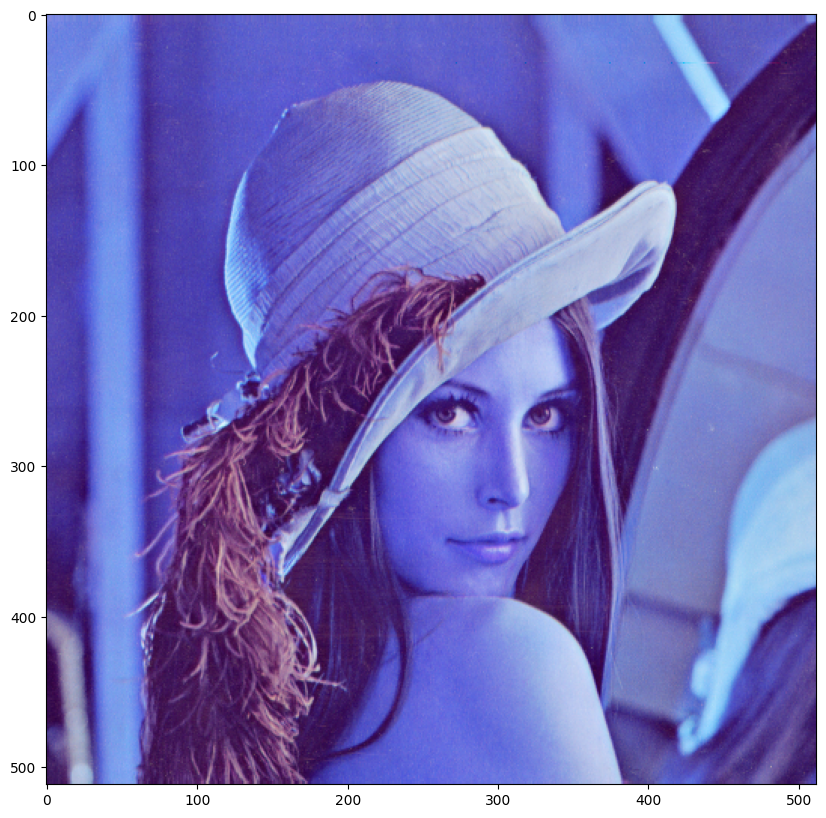

In [4]:
# show image with matplotlib
plt.imshow(img)

In OpenCV, a BGR image can be converted to an RGB image by the `cv2.cvtColor()` function as follows

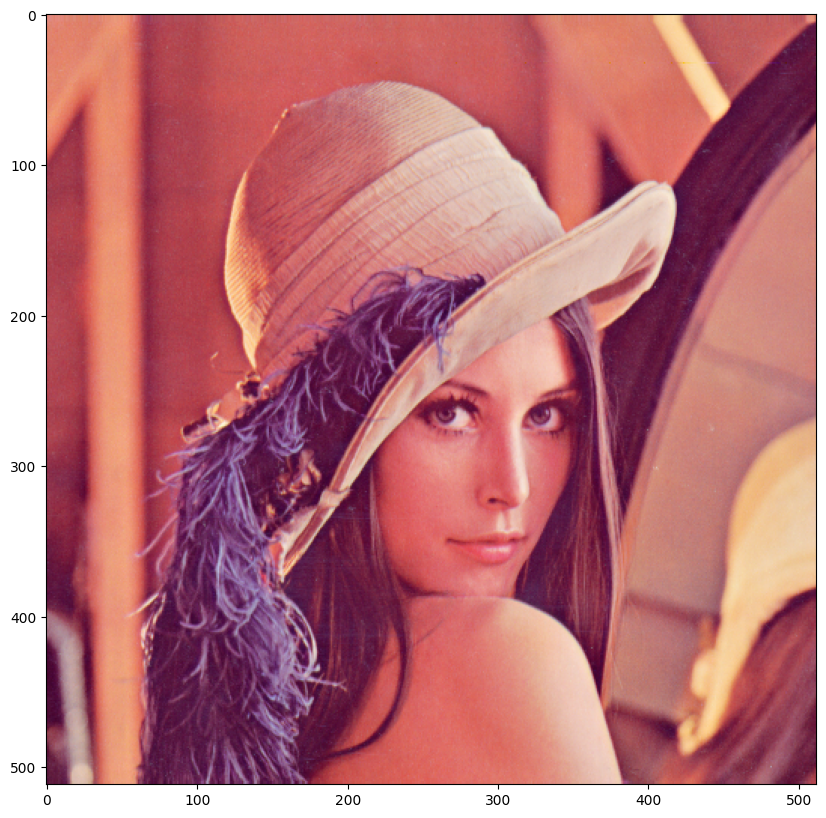

In [5]:
# convert image to RGB color space
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# show image with matplotlib
plt.imshow(img)

In a similar way, a BGR image can also be converted to grayscale image which has only a single channel. Converting an RGB image into a grayscale image involves summing up the individual (RGB) components with the weights (0.299, 0.587, 0.114). The OpenCV function `cv2.cvtColor()` can also be used to convert an RGB image into a grayscale image.

In [6]:
# convert image to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

print('Image shape: {}'.format(gray_img.shape))
# grayscale image represented as a 2-d array
print(gray_img)

Image shape: (512, 512)
[[162 162 162 ... 170 155 128]
 [162 162 162 ... 170 155 128]
 [162 162 162 ... 170 155 128]
 ...
 [ 43  43  50 ... 104 100  98]
 [ 44  44  55 ... 104 105 108]
 [ 44  44  55 ... 104 105 108]]


Gray images have single channel

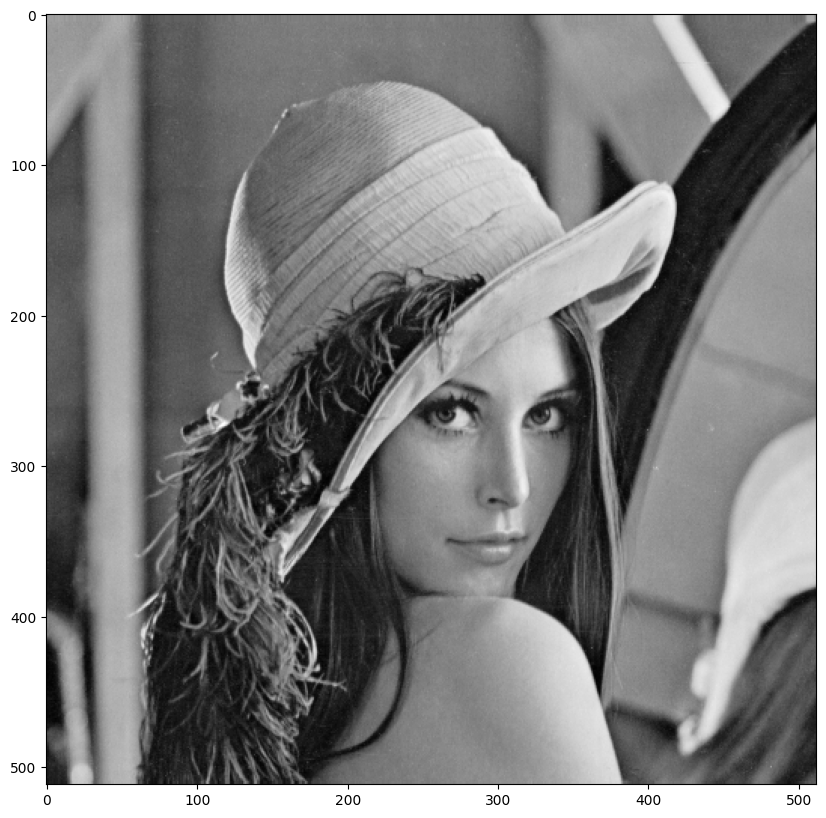

In [7]:
# plot the gray image, note the cmap parameter
plt.imshow(gray_img, cmap='gray')

Color to grayscale is a lossy conversion. However, in OpenCV a grayscale image can approximately be converted to a colour image using the `cv2.applyColorMap()` function according to the color maps described at this [link](https://docs.opencv.org/4.x/d3/d50/group__imgproc__colormap.html).

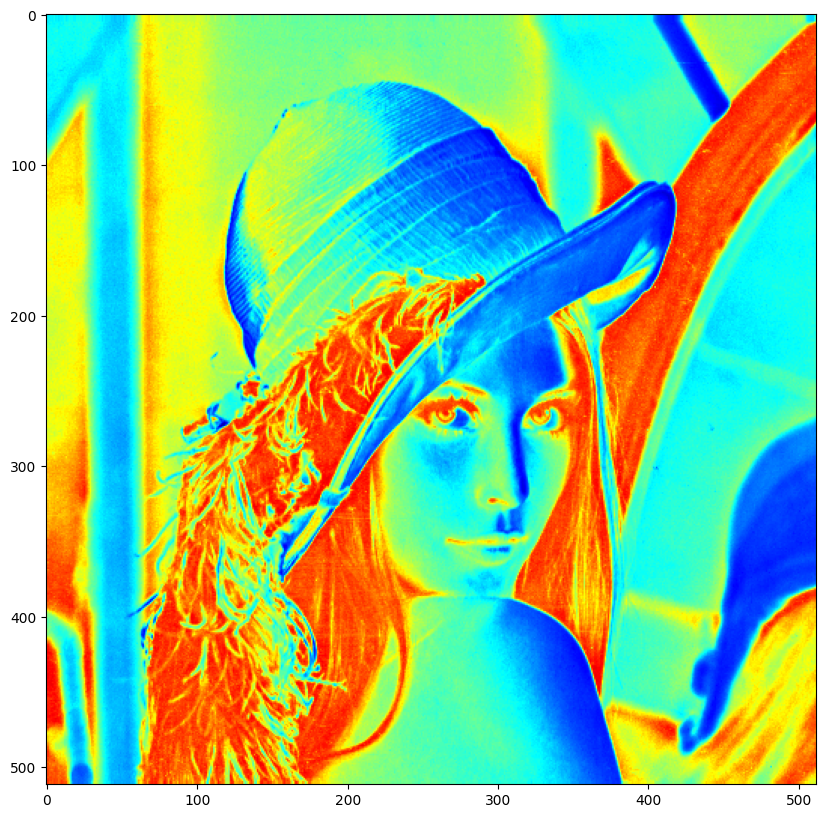

In [8]:
gray_img_col = cv2.applyColorMap(gray_img, cv2.COLORMAP_JET)
plt.imshow(gray_img_col)

### Conversion from `uint8` to `float64` (`double`) and Normalization

In [9]:
img_dble = cv2.normalize(img.astype('float64'), None, 0.0, 1.0, cv2.NORM_MINMAX)
print(img_dble)

[[[0.88492063 0.53174603 0.48412698]
  [0.88492063 0.53174603 0.48412698]
  [0.87301587 0.53174603 0.51587302]
  ...
  [0.90079365 0.57539683 0.47222222]
  [0.86507937 0.50396825 0.42460317]
  [0.78174603 0.38095238 0.3452381 ]]

 [[0.88492063 0.53174603 0.48412698]
  [0.88492063 0.53174603 0.48412698]
  [0.87301587 0.53174603 0.51587302]
  ...
  [0.90079365 0.57539683 0.47222222]
  [0.86507937 0.50396825 0.42460317]
  [0.78174603 0.38095238 0.3452381 ]]

 [[0.88492063 0.53174603 0.48412698]
  [0.88492063 0.53174603 0.48412698]
  [0.87301587 0.53174603 0.51587302]
  ...
  [0.90079365 0.57539683 0.47222222]
  [0.86507937 0.50396825 0.42460317]
  [0.78174603 0.38095238 0.3452381 ]]

 ...

 [[0.32142857 0.05952381 0.22619048]
  [0.32142857 0.05952381 0.22619048]
  [0.3531746  0.0952381  0.21825397]
  ...
  [0.67460317 0.27777778 0.32142857]
  [0.67063492 0.25793651 0.28968254]
  [0.69047619 0.23412698 0.3015873 ]]

 [[0.31349206 0.07539683 0.21428571]
  [0.31349206 0.07539683 0.21428571]


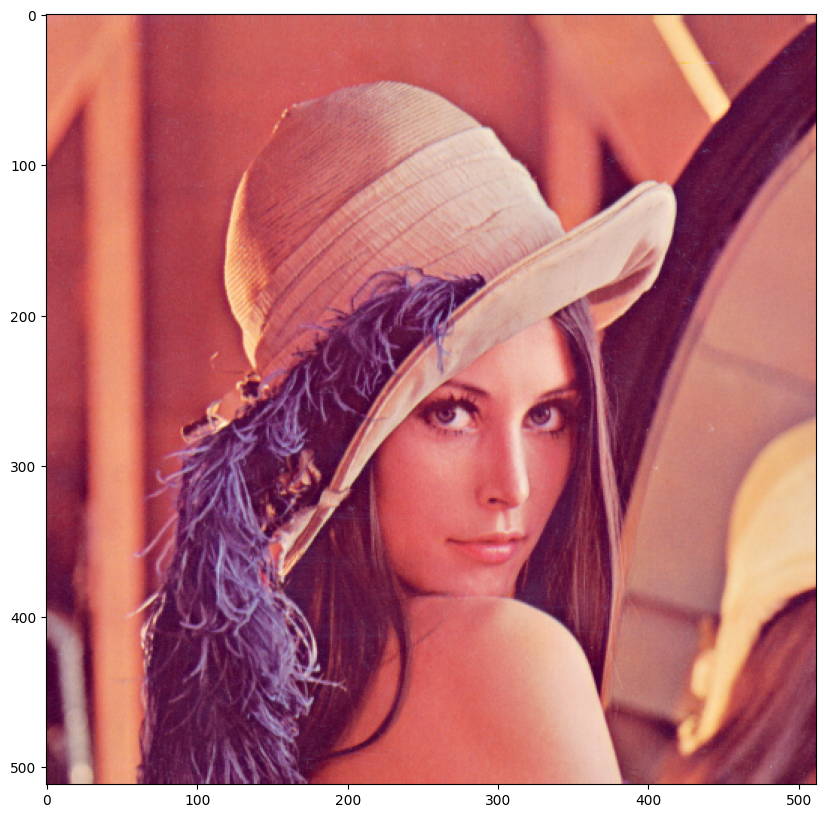

In [10]:
plt.imshow(img_dble)

## Average colour of an image
Average colour of an image can be computed as follows

In [11]:
# find average per row
# np.average() takes in an axis argument which finds the average across that axis. 
average_color_per_row = np.average(img, axis=0)

# find average across average per row
average_color = np.average(average_color_per_row, axis=0)

# convert back to uint8
average_color = np.uint8(average_color)
print(average_color)

[180  99 105]


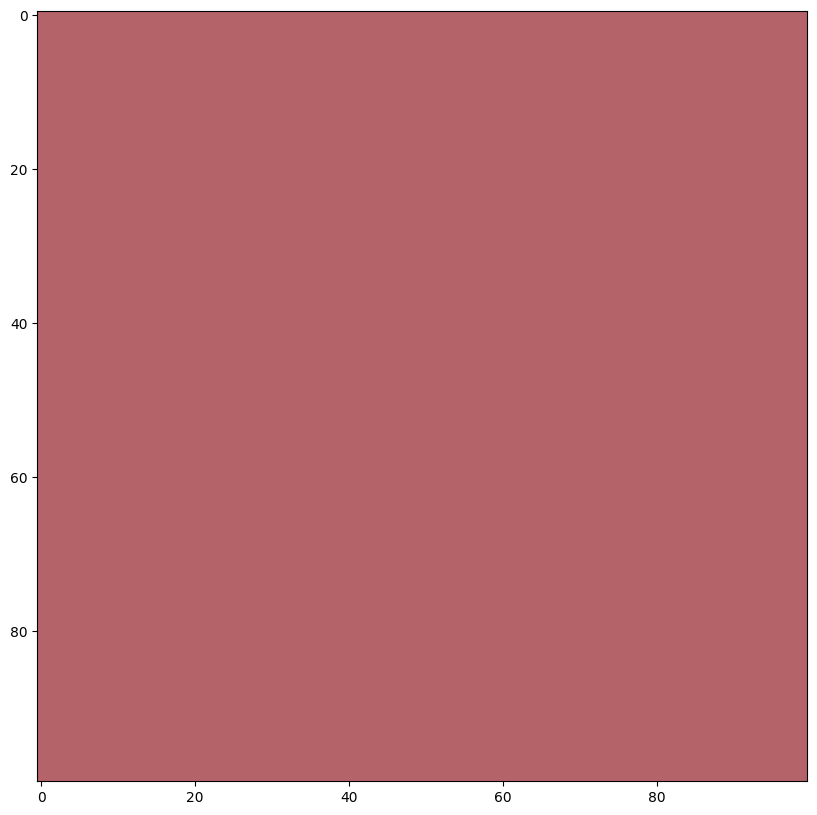

In [12]:
# create 100 x 100 pixel array with average color value
average_color_img = np.array([[average_color]*100]*100, np.uint8)
plt.imshow(average_color_img)

## Box Filtering
In this, each pixel value in an image is replaced by the weighted average of the neighborhood (defined by the filter mask) intensity values. The most commonly used filter is the Box filter which has equal weights. A 3×3 normalized box filter is shown below

![box filter](https://i2.wp.com/theailearner.com/wp-content/uploads/2019/05/filter1.png?w=454&ssl=1)

It is a good practice to normalize the filter, this is why the above filter is divided by 9. This is to make sure that the image does not get brighter or darker. You can also use an unnormalized box filter.

OpenCV provides two inbuilt functions for averaging namely:

* `cv2.blur()` that blurs an image using only the normalized box filter and
* `cv2.boxFilter()` which is more general, having the option of using either normalized or unnormalized box filter. Just pass an argument normalize=False to the function

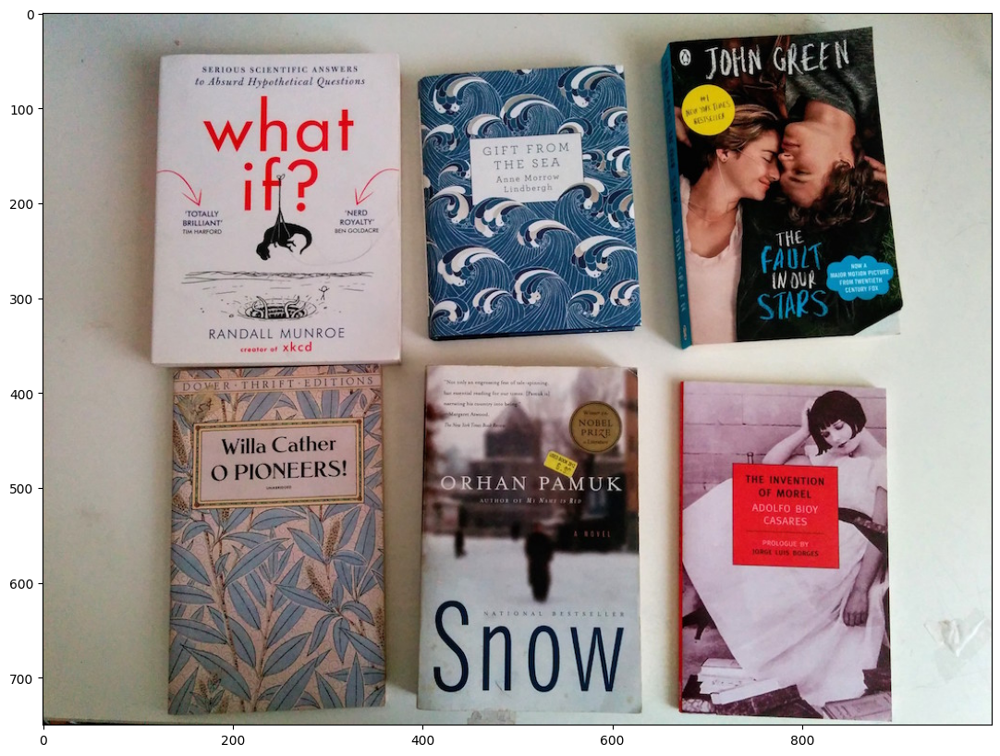

In [13]:
img = cv2.cvtColor(cv2.imread('images/books.jpg'), cv2.COLOR_BGR2RGB)
plt.imshow(img)

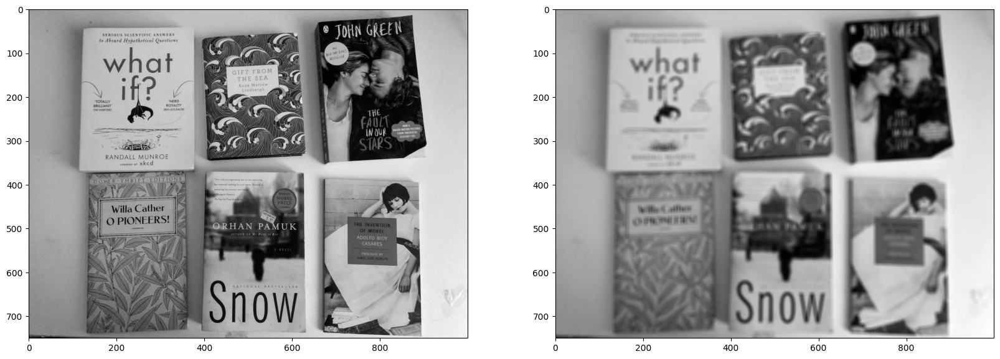

In [14]:
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
blur_img = cv2.blur(gray_img, (10, 10))
plt.subplot(1, 2, 1); plt.imshow(gray_img, cmap='gray')
plt.subplot(1, 2, 2); plt.imshow(blur_img, cmap='gray')

### Ringing Artifact
In digital image processing, ringing artifacts are artifacts that appear as spurious signals near sharp transitions or edge in a signal. Visually, they appear as bands or "ghosts" near edges. In certain cases, box filtering often suffers from ringing artifact.

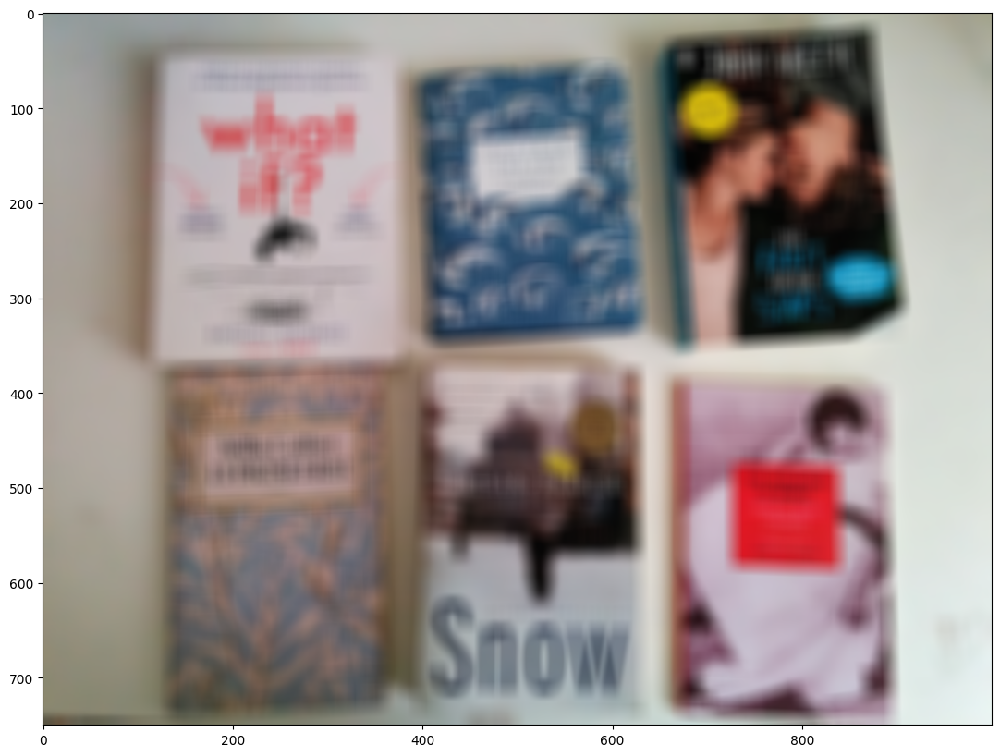

In [15]:
# box filtering with 20x20 kernel
blur = cv2.blur(img, (20, 20))
plt.imshow(blur)

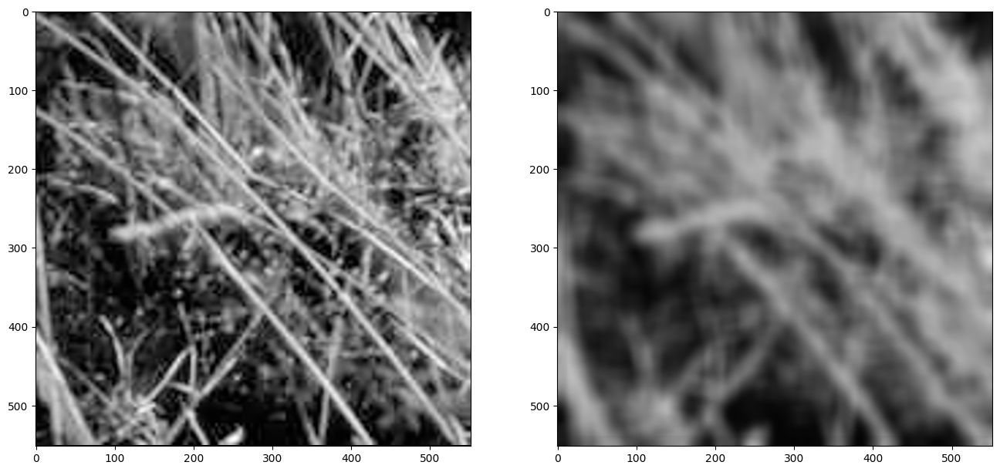

In [16]:
gray_img = cv2.imread('images/grass.png')
blur_img = cv2.blur(gray_img, (25, 25))
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1); plt.imshow(gray_img, cmap='gray')
plt.subplot(1, 2, 2); plt.imshow(blur_img, cmap='gray')

## Gaussian Filtering
In Gaussian filtering, instead of a box filter, a Gaussian kernel is used. In OpenCV, it is done with the function, `cv2.GaussianBlur()`. We should specify the width and height of the kernel which should be positive and odd. We also should specify the standard deviation in the X and Y directions, sigmaX and sigmaY respectively. If only sigmaX is specified, sigmaY is taken as the same as sigmaX. If both are given as zeros, they are calculated from the kernel size. Gaussian blurring is highly effective in removing Gaussian noise from an image.

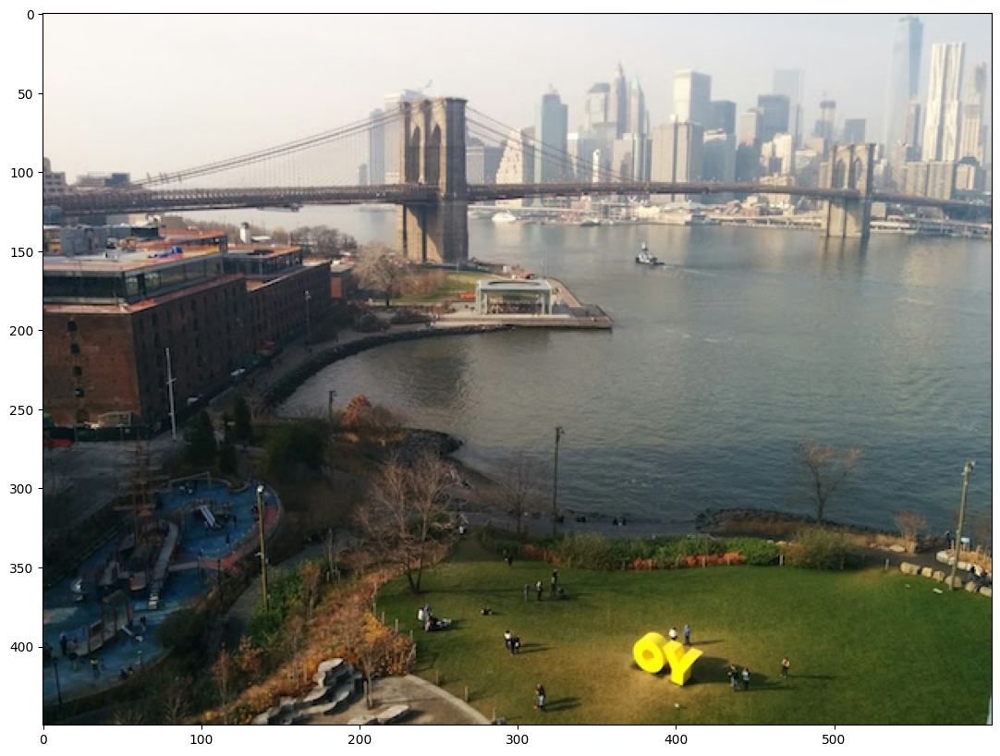

In [17]:
img = cv2.cvtColor(cv2.imread('images/oy.jpg'), cv2.COLOR_BGR2RGB)
plt.imshow(img)

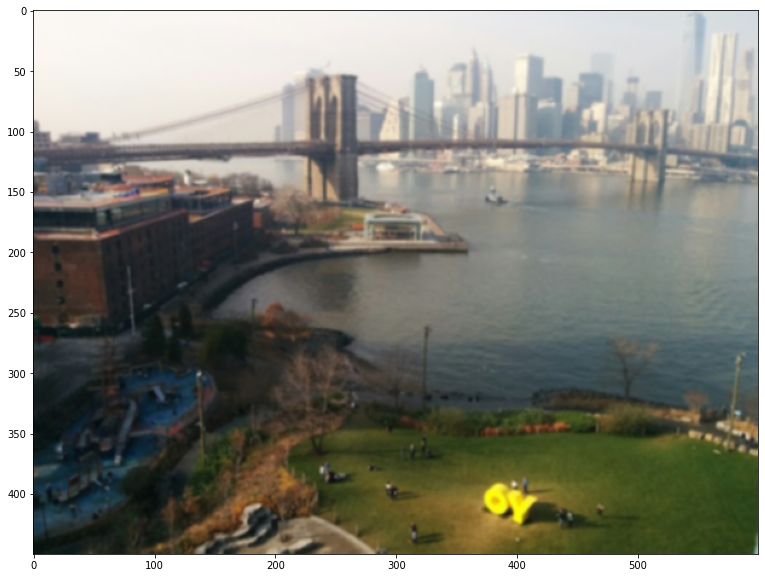

In [ ]:
# preproccess with blurring, with 5x5 kernel (note kernel size should be odd)
img_blur_small = cv2.GaussianBlur(img, (5, 5), 0)
plt.imshow(img_blur_small)

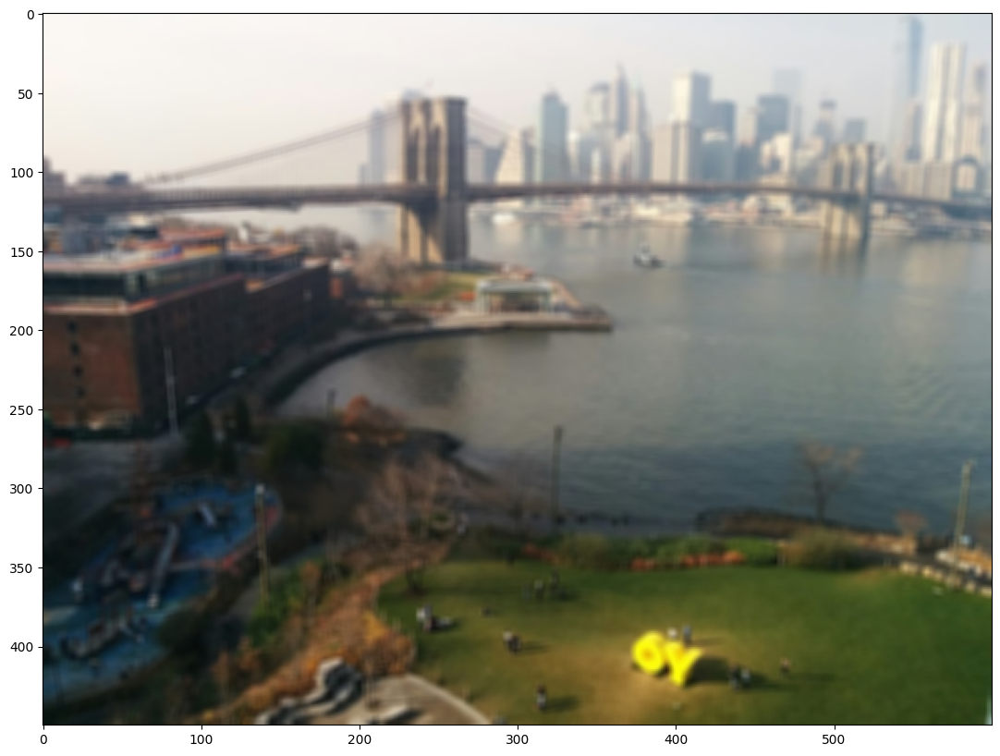

In [18]:
img_blur_small = cv2.GaussianBlur(img, (5, 5), 25)
plt.imshow(img_blur_small)

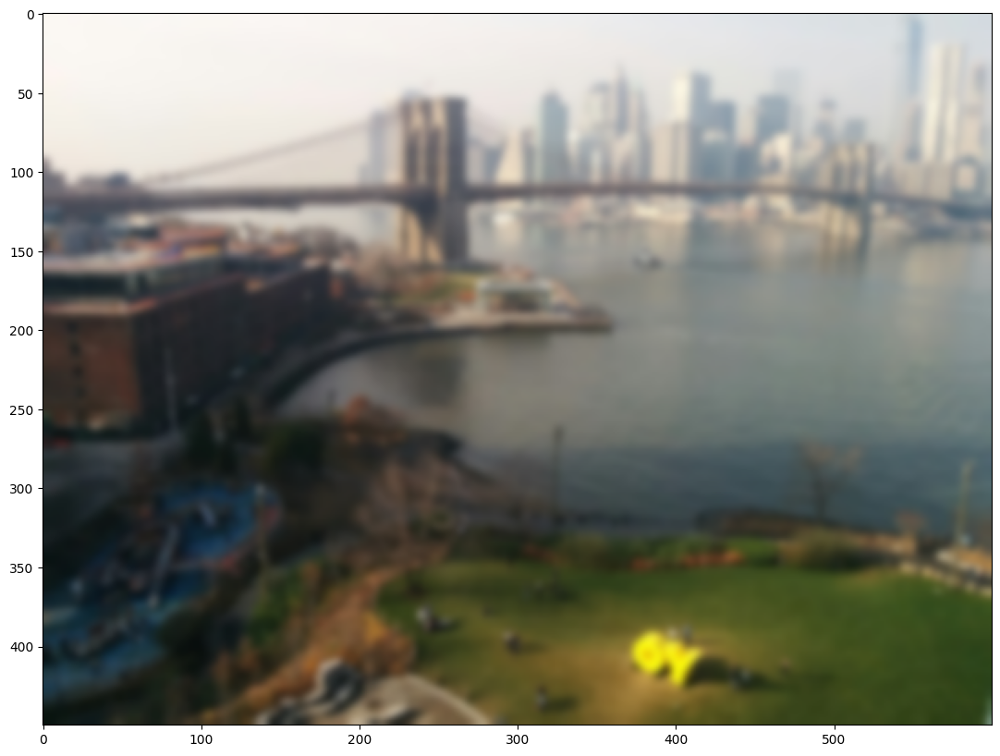

In [20]:
img_blur_large = cv2.GaussianBlur(img, (15,15), 0)
plt.imshow(img_blur_large)

## Unsharp Masking or Sharpening
Unsharp masking (USM) or sharpening is an image sharpening technique, first implemented in darkroom photography, but now commonly used in digital image processing software. Its name derives from the fact that the technique uses a blurred, or "unsharp" negative image to create a mask of the original image. The unsharp negative mask is then combined with the original positive image, creating an image that is more sharp than the original. The formulation could be understood as follows.

\begin{align}
I_\text{sharp} &= I_\text{original} + \alpha I_\text{detail}\\
               &= I_\text{original} + \alpha I_\text{original} - \alpha I_\text{blurred}\\
               &=(1+\alpha)I_\text{original} - \alpha I_\text{blurred}
\end{align}

We are using the `cv2.addWeighted()` function from OpenCV to combine the weighted unsharp negative image with the original image.

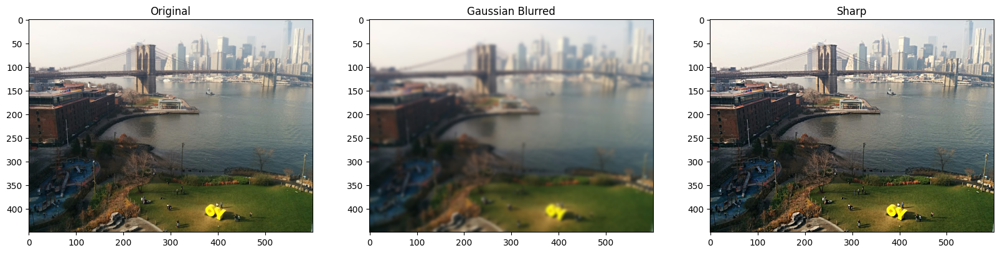

In [21]:
alpha = 0.5
img = cv2.cvtColor(cv2.imread('images/oy.jpg'), cv2.COLOR_BGR2RGB)
img_sharp = cv2.addWeighted(img, 1.0 + alpha, img_blur_large, -alpha, 0)
plt.subplot(1, 3, 1); plt.imshow(img); plt.title('Original')
plt.subplot(1, 3, 2); plt.imshow(img_blur_large); plt.title('Gaussian Blurred')
plt.subplot(1, 3, 3); plt.imshow(img_sharp); plt.title('Sharp');

## Median Filtering
This is a non-linear filtering technique. As clear from the name, this takes a median of all the pixels under the kernel area and replaces the central element with this median value. This is quite effective in reducing a certain type of noise (like salt-and-pepper noise) with considerably less edge blurring as compared to other linear filters of the same size. First create the function for creating noisy images with "salt and pepper" noise.

In [22]:
def add_sp_noise(image, amount=0.1):
    row, col, ch = image.shape
    s_vs_p = 0.5
    out = np.copy(image)
    # Salt mode
    num_salt = np.ceil(amount * image.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt))
            for i in image.shape]
    out[coords[0], coords[1], coords[2]] = 1

    # Pepper mode
    num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper))
            for i in image.shape]
    out[coords[0], coords[1], coords[2]] = 0
    return out

Load an image and apply "salt and pepper" noise and then try to smooth it with Gaussian and Median filter

Text(0.5, 1.0, 'Median Filtered')

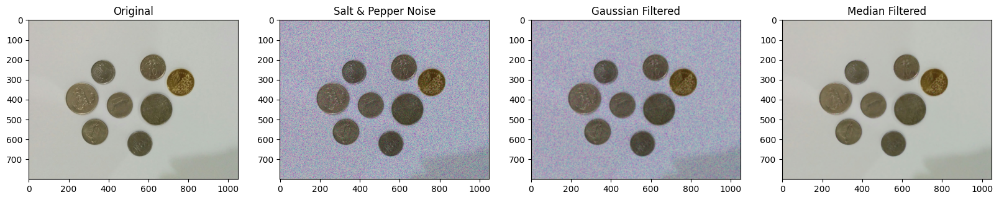

In [23]:
img = cv2.cvtColor(cv2.imread('images/coins.jpg'), cv2.COLOR_BGR2RGB)
noisy_img = add_sp_noise(img, amount=0.1)
img_gaus = cv2.GaussianBlur(noisy_img, (5, 5), 3)
img_med = cv2.medianBlur(noisy_img, 5)
plt.subplot(1, 4, 1); plt.imshow(img); plt.title('Original')
plt.subplot(1, 4, 2); plt.imshow(noisy_img); plt.title('Salt & Pepper Noise')
plt.subplot(1, 4, 3); plt.imshow(img_gaus); plt.title('Gaussian Filtered')
plt.subplot(1, 4, 4); plt.imshow(img_med); plt.title('Median Filtered')

## Image Gradient
An image gradient is a directional change in the intensity or color in an image. The gradient of the image is one of the fundamental building blocks in image processing. For example, the edge detector and the corner detector use image gradient for understanding the rate of change required in the edge or corner detection. In graphics software for digital image editing, the term gradient or color gradient is also used for a gradual blend of color which can be considered as an even gradation from low to high values, as used from white to black in the images to the right.

Computing and processing image gradient needs keeping negative values. OpenCV provides several functions (such as `cv2.Sobel()`, `cv2.Laplacian()`) for computing image gradients with several filters, such as Sobel and Laplacian filters. Note the usual image datatype `cv2.CV_8U` cannot contain negative values, it can only contain the positive values of the gradient.

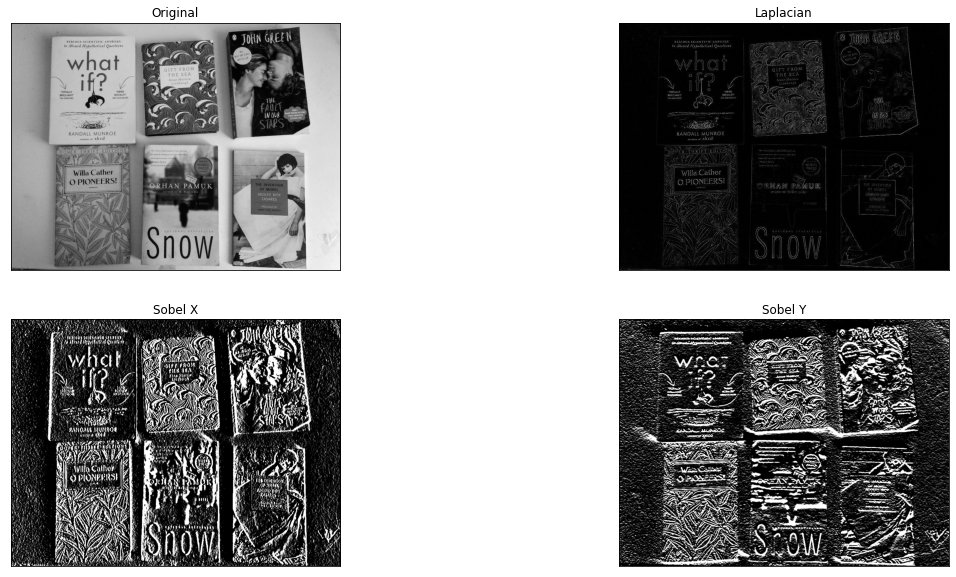

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('images/books.jpg', 0)

laplacian = cv2.Laplacian(img, cv2.CV_8U)
sobelx = cv2.Sobel(img, cv2.CV_8U, 1, 0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_8U, 0, 1, ksize=5)

plt.subplot(2,2,1),plt.imshow(img, cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian, cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx, cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely, cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

plt.show()

Therefore, the datatype `cv2.CV_64F` should be considered to process the negative values.

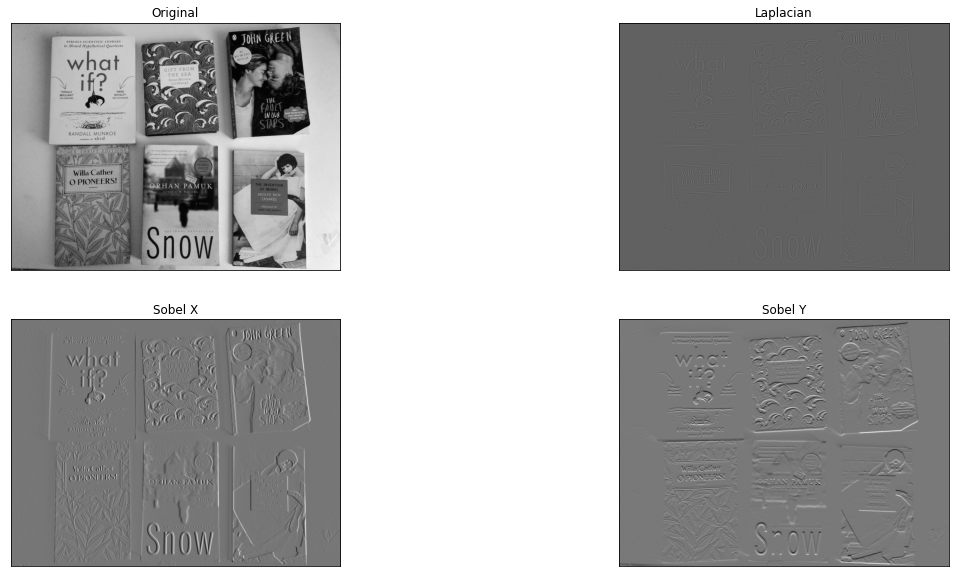

In [ ]:
laplacian = cv2.Laplacian(img, cv2.CV_64F)
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)

plt.subplot(2,2,1),plt.imshow(img, cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian, cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx, cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely, cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

plt.show()